# Surface-side check: is the model reading ink on the wrong face?

The Paris4 3D-ink check showed ink only partly concentrated at the guessed surface. This notebook checks the three worst-performing training patches (w059, Cr1 Fr3, 500P2 front) by running the Campaign 31 baseline winner on two surface maps per patch:

1. **default**: last papyrus slice before the strongest papyrus-to-air transition (the current training convention)
2. **reversed**: first papyrus slice after the strongest air-to-papyrus transition (`generate_surface_supervision.py --reverse`), i.e. the opposite face of the sheet

Both maps are regenerated from scratch with identical detector settings and the per-scroll depth window from the existing `surface_labels/<id>/metadata.json`. They are written under `output/surface_side_check/`, so training labels in `surface_labels/` are not touched.

Run all cells top to bottom. Figures go to `output/eval_visualizations/<run>_surface_side/`.

In [1]:
# campaign 31 early-gated patch-GroupDRO baseline winner
import json
import os
from pathlib import Path

EXP_NAME = os.getenv("VESUVIUS_EXP_NAME", "31_early_gated_patch_groupdro")
RUN_ROOT = Path(os.getenv("VESUVIUS_RUN_ROOT", "/vesuvius/runs_archs31"))
RUN_ID = os.getenv("VESUVIUS_RUN_ID", "31_early_gated_patch_groupdro_23_13-58-13")
RUN_DIR = RUN_ROOT / RUN_ID
RUN_CONFIG_PATH = RUN_DIR / "config.json"
if not RUN_CONFIG_PATH.is_file():
    candidates = sorted(RUN_ROOT.glob(f"{EXP_NAME}_*/config.json"), key=lambda path: path.stat().st_mtime)
    if not candidates:
        raise FileNotFoundError(f"no run config matching {EXP_NAME!r} under {RUN_ROOT}")
    RUN_CONFIG_PATH = candidates[-1]
    RUN_DIR = RUN_CONFIG_PATH.parent
    RUN_ID = RUN_DIR.name

MODEL_PATH = Path(os.getenv(
    "VESUVIUS_MODEL_PATH",
    "/vesuvius/models/archs31/early_gated_patch_groupdro/final_best_character.pth",
))
if not MODEL_PATH.is_file():
    raise FileNotFoundError(f"Campaign 31 checkpoint is missing: {MODEL_PATH}")

with open(RUN_CONFIG_PATH, "r", encoding="utf-8") as handle:
    RUN_CONFIG = json.load(handle)
_RUN_DATA = RUN_CONFIG["data"]
_RUN_MODEL = RUN_CONFIG["model"]

DEPTH = int(_RUN_DATA["depth"])
CONTEXT_SIZE = int(_RUN_DATA["context_size"])
CONTEXT_DOWNSAMPLE = int(_RUN_DATA["context_downsample"])
TTA = False
EVAL_CMAP_NORM = "raw"
EVAL_DPI = 200
OUTPUT_DIR = "output"

CHECK_SCROLLS = {
    "w059": 20250223000000,
    "cr1fr3": 20231201215900,
    "500P2_front": 20250628074500,
}
SIDE_ROOT = Path(OUTPUT_DIR) / "surface_side_check"
SURFACE_DIRS = {
    "default": SIDE_ROOT / "default_labels",
    "reversed": SIDE_ROOT / "reversed_labels",
}
TRAINING_SURFACE_DIR = Path(_RUN_DATA["surface_label_dir"])

if DEPTH != 8 or not _RUN_MODEL.get("surface_teacher_input") or not _RUN_DATA.get("surface_relative_depth_window"):
    raise RuntimeError("selected run is not literal-surface true slice-8")
if not _RUN_MODEL.get("early_2d_unet") or not _RUN_MODEL.get("gated_stems"):
    raise RuntimeError("selected run is not the early-2D gated baseline")
print(RUN_ID, MODEL_PATH, f"depth={DEPTH}", "literal surface", f"ctx={CONTEXT_SIZE}/ds{CONTEXT_DOWNSAMPLE}")

31_early_gated_patch_groupdro_23_13-58-13 /vesuvius/models/archs31/early_gated_patch_groupdro/final_best_character.pth depth=8 literal surface ctx=192/ds2


In [2]:
import gc
import importlib
import subprocess
import sys
import types

REPO = "/vesuvius"
if REPO not in sys.path:
    sys.path.insert(0, REPO)
os.chdir(REPO)

import cv2
import matplotlib.pyplot as plt
import numpy as np
import torch
import zarr

from utils.config import Config, ScrollConfig
from utils.dataloader import _load_unified_cache
from utils.model import create_model
from utils.platform import get_zarr_dir
from utils import visualizer as visualizer_module

# reload so an existing kernel cannot retain a stale inference reader
visualizer_module = importlib.reload(visualizer_module)
TBV = visualizer_module.TensorboardVisualizer
predict_tiles = visualizer_module.predict_tiles
group_by_depth = visualizer_module.group_by_depth
imread_gray = visualizer_module.imread_gray

try:
    get_ipython().run_line_magic("matplotlib", "inline")
except Exception:
    pass

os.makedirs(OUTPUT_DIR, exist_ok=True)
print("torch", torch.__version__, "| cuda", torch.cuda.is_available())

2026-09-23 21:37:37.466042: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2026-09-23 21:37:37.474218: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1790199457.483145  813170 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1790199457.486068  813170 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1790199457.493832  813170 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking 

torch 2.11.0+cu128 | cuda True


/vesuvius/utils/visualizer.py:55: UserWarning: Overwriting the cmap 'inferno_nan' that was already in the registry.
  _mpl.colormaps.register(_inferno_nan, name='inferno_nan', force=True)
/vesuvius/utils/visualizer.py:56: UserWarning: Overwriting the cmap 'ylgnbu_nan' that was already in the registry.
  _mpl.colormaps.register(_ylgnbu_nan, name='ylgnbu_nan', force=True)
/vesuvius/utils/visualizer.py:57: UserWarning: Overwriting the cmap 'purples_nan' that was already in the registry.
  _mpl.colormaps.register(_purples_nan, name='purples_nan', force=True)


In [3]:
# regenerate default and reversed surface supervision for every checked scroll
ZARR_DIR = get_zarr_dir()


def regenerate_surface(sid, side):
    metadata = json.loads((TRAINING_SURFACE_DIR / str(sid) / "metadata.json").read_text())
    command = [
        sys.executable, "-u", "generate_surface_supervision.py",
        "--scroll-id", str(sid),
        "--zarr-dir", ZARR_DIR,
        "--z-start", str(metadata["z_start"]),
        "--z-end", str(metadata["z_end"]),
        "--output-dir", str(SURFACE_DIRS[side]),
        "--review-dir", str(SIDE_ROOT / f"{side}_review"),
    ]
    if side == "reversed":
        command.append("--reverse")
    print("$", " ".join(command), flush=True)
    result = subprocess.run(command, capture_output=True, text=True)
    if result.returncode != 0:
        print(result.stdout[-4000:], result.stderr[-4000:])
        raise RuntimeError(f"surface generation failed for {sid} ({side})")
    print("\n".join(line for line in result.stdout.splitlines() if "valid inside mask" in line))


def load_surface(root, sid):
    depth = np.load(Path(root) / str(sid) / "depth.npy", mmap_mode="r")
    confidence = np.load(Path(root) / str(sid) / "confidence.npy", mmap_mode="r")
    return depth, confidence


for name, sid in CHECK_SCROLLS.items():
    for side in SURFACE_DIRS:
        regenerate_surface(sid, side)
    training_depth, training_conf = load_surface(TRAINING_SURFACE_DIR, sid)
    default_depth, default_conf = load_surface(SURFACE_DIRS["default"], sid)
    reversed_depth, reversed_conf = load_surface(SURFACE_DIRS["reversed"], sid)
    both = (default_conf > 0) & (reversed_conf > 0)
    trained = (training_conf > 0) & (default_conf > 0)
    gap = reversed_depth[both].astype(np.int16) - default_depth[both].astype(np.int16)
    print(
        f"[{name}] default mean depth {default_depth[default_conf > 0].mean():.2f} | "
        f"reversed mean depth {reversed_depth[reversed_conf > 0].mean():.2f} | "
        f"reversed-default gap median {np.median(gap):+.0f} (p10 {np.percentile(gap, 10):+.0f}, "
        f"p90 {np.percentile(gap, 90):+.0f}) | "
        f"regenerated default == training labels: "
        f"{(training_depth[trained] == default_depth[trained]).mean():.4f}",
        flush=True,
    )

$ /usr/bin/python -u generate_surface_supervision.py --scroll-id 20250223000000 --zarr-dir /vesuvius/ves_zarrs2 --z-start 4 --z-end 28 --output-dir output/surface_side_check/default_labels --review-dir output/surface_side_check/default_review
[surface] valid inside mask: 98.47%
$ /usr/bin/python -u generate_surface_supervision.py --scroll-id 20250223000000 --zarr-dir /vesuvius/ves_zarrs2 --z-start 4 --z-end 28 --output-dir output/surface_side_check/reversed_labels --review-dir output/surface_side_check/reversed_review --reverse
[surface] valid inside mask: 97.35%
[w059] default mean depth 15.33 | reversed mean depth 14.75 | reversed-default gap median -1 (p10 -5, p90 +3) | regenerated default == training labels: 1.0000
$ /usr/bin/python -u generate_surface_supervision.py --scroll-id 20231201215900 --zarr-dir /vesuvius/ves_zarrs2 --z-start 3 --z-end 25 --output-dir output/surface_side_check/default_labels --review-dir output/surface_side_check/default_review
[surface] valid inside mask:

In [4]:
# config, strict model loading, split helpers, and per-scroll rendering
_AUXILIARY_PREFIXES = ("supcon_head.", "domain_head.")


def build_config():
    c = Config()
    # replay the full saved run config so geometry, surface window, and splits match training
    for name, value in _RUN_DATA.items():
        if name == "scrolls":
            c.data.scrolls = [ScrollConfig(**item) for item in value]
        elif name != "probe_rois" and hasattr(c.data, name):
            setattr(c.data, name, value)
    c.data.eval_cmap_norm = EVAL_CMAP_NORM
    for name, value in _RUN_MODEL.items():
        if hasattr(c.model, name):
            setattr(c.model, name, value)
    c.model.compile_model = False
    c.tra.supcon = False
    c.tra.dann = False
    c.device = "cuda" if torch.cuda.is_available() else "cpu"
    return c


def _checkpoint_state(path):
    state = torch.load(path, map_location="cpu", weights_only=True)
    if isinstance(state, dict) and "state_dict" in state:
        state = state["state_dict"]
    cleaned = {}
    for key, value in state.items():
        key = key.removeprefix("module.").removeprefix("_orig_mod.")
        if not key.startswith(_AUXILIARY_PREFIXES):
            cleaned[key] = value
    return cleaned, len(state) - len(cleaned)


def load_model(c):
    model, n = create_model(c)
    state, ignored = _checkpoint_state(MODEL_PATH)
    model.load_state_dict(state, strict=True)
    model.eval()
    print(f"loaded {MODEL_PATH} params={n:,} ignored_training_only={ignored}")
    return model


def _scroll_cfg(sid, c):
    return next((scroll for scroll in c.data.scrolls if int(scroll.scroll_id) == int(sid)), None)


def _splits(sid, height, width, c):
    tile = c.data.tile_size
    scroll = _scroll_cfg(sid, c)
    crop_x = scroll.crop_x_frac if scroll else (0.0, 1.0)
    crop_y = scroll.crop_y_frac if scroll else (0.0, 1.0)
    axis = (scroll.split_axis if scroll else "x").lower()
    fraction = scroll.train_split_frac if scroll else 0.75
    x0 = (int(width * crop_x[0]) // tile) * tile
    x1 = max((int(width * crop_x[1]) // tile) * tile, x0 + tile)
    y0 = (int(height * crop_y[0]) // tile) * tile
    y1 = max((int(height * crop_y[1]) // tile) * tile, y0 + tile)
    if axis == "y":
        split = (int((y1 - y0) * fraction) // tile) * tile
        train_range = (y0, y0 + split)
    else:
        split = (int((x1 - x0) * fraction) // tile) * tile
        train_range = (x0, x0 + split)
    return (y0, y1), (x0, x1), (train_range[1] - train_range[0]) // tile, axis


def get_norm(sid):
    stats = _load_unified_cache().get(str(sid))
    if stats and all(key in stats for key in ("mean", "std", "min", "max")):
        return stats["mean"], stats["std"], stats["min"], stats["max"]
    raise RuntimeError(f"normalization cache missing for {sid}")


def render_side(name, side, model, c):
    sid = int(CHECK_SCROLLS[name])
    fake = types.SimpleNamespace(c=c)
    fake._display_norm = types.MethodType(TBV._display_norm, fake)
    vol = zarr.open(os.path.join(c.data.zarr_path, f"{sid}.zarr"), mode="r")
    height, width = int(vol.shape[1]), int(vol.shape[2])
    mask = (imread_gray(f"masks/{sid}.png") > 127).astype(np.uint8)
    labels = (imread_gray(f"eroded_inklabels/{sid}.png") > 127).astype(np.uint8)
    common_height = min(height, mask.shape[0], labels.shape[0])
    common_width = min(width, mask.shape[1], labels.shape[1])
    vol = vol[:, :common_height, :common_width]
    mask = mask[:common_height, :common_width]
    labels = labels[:common_height, :common_width]
    mean, std, global_min, global_max = get_norm(sid)
    surface_depth, surface_confidence = load_surface(SURFACE_DIRS[side], sid)

    full_y, full_x, train_split_n, split_axis = _splits(sid, common_height, common_width, c)
    coords = TBV._gen_tile_coords(
        fake, (c.data.d_start, c.data.d_end), full_y, full_x, mask, z_step=c.data.depth
    )
    grouped = group_by_depth(coords)
    if len(grouped) != 1:
        raise RuntimeError(f"surface-relative inference expected one depth pass, got {len(grouped)}")
    depth_offset = next(iter(grouped))
    reg_pred = predict_tiles(
        c, model, vol, mask, grouped[depth_offset], full_y, full_x,
        c.data.d_start + depth_offset, f"side_{side}_{sid}", mean, std, global_min, global_max,
        surface_depth_map=surface_depth, surface_confidence_map=surface_confidence,
    )
    label_binary, _, _ = TBV._compute_tile_maps(fake, labels, mask, full_y, full_x)
    pred_height, pred_width = reg_pred.shape

    def _raw(subdir):
        image = imread_gray(f"./inklabels/{subdir}/{sid}.png")
        if image is None:
            return None
        mh, mw = mask.shape
        rh, rw = image.shape
        crop = image[
            int(full_y[0] * rh / mh):int(full_y[1] * rh / mh),
            int(full_x[0] * rw / mw):int(full_x[1] * rw / mw),
        ]
        return cv2.resize(crop, (pred_width, pred_height), interpolation=cv2.INTER_LINEAR)

    fig = TBV._create_eval_figure_2x2(
        fake, reg_pred, None, label_binary, _raw("1_1um"), _raw("2_4um"),
        train_split_n, split_axis,
    )
    fig.suptitle(f"{name} (scroll {sid}) {split_axis}-split | {side} surface", fontsize=10)
    out_dir = Path(OUTPUT_DIR) / "eval_visualizations" / f"{RUN_ID}_surface_side"
    out_dir.mkdir(parents=True, exist_ok=True)
    out_path = out_dir / f"{name}_{sid}_{side}.png"
    fig.savefig(out_path, dpi=EVAL_DPI, bbox_inches="tight")
    plt.show()
    plt.close(fig)
    print(f"[saved] {out_path} pred grid {reg_pred.shape}")
    del vol, mask, labels, reg_pred, label_binary, fig
    gc.collect()
    if torch.cuda.is_available():
        torch.cuda.empty_cache()

In [5]:
# build config and load the model once
C = build_config()
C.data.zarr_path = ZARR_DIR
MODEL = load_model(C)
print("arch:", C.model.arch, "| zarr:", C.data.zarr_path,
      "| surface window offset:", C.data.surface_window_offset)

Model parameters (nnunet3d_lcndz): 7,522,714
loaded /vesuvius/models/archs31/early_gated_patch_groupdro/final_best_character.pth params=7,522,714 ignored_training_only=0
arch: nnunet3d_lcndz | zarr: /vesuvius/ves_zarrs2 | surface window offset: 0


[predict] reading 234541 tiles in 444 row-strips (side_default_20250223000000)


[predict] side_default_20250223000000 done in 351.4s  predict 261.1s (74.3%)  read/wait  90.4s (25.7%)


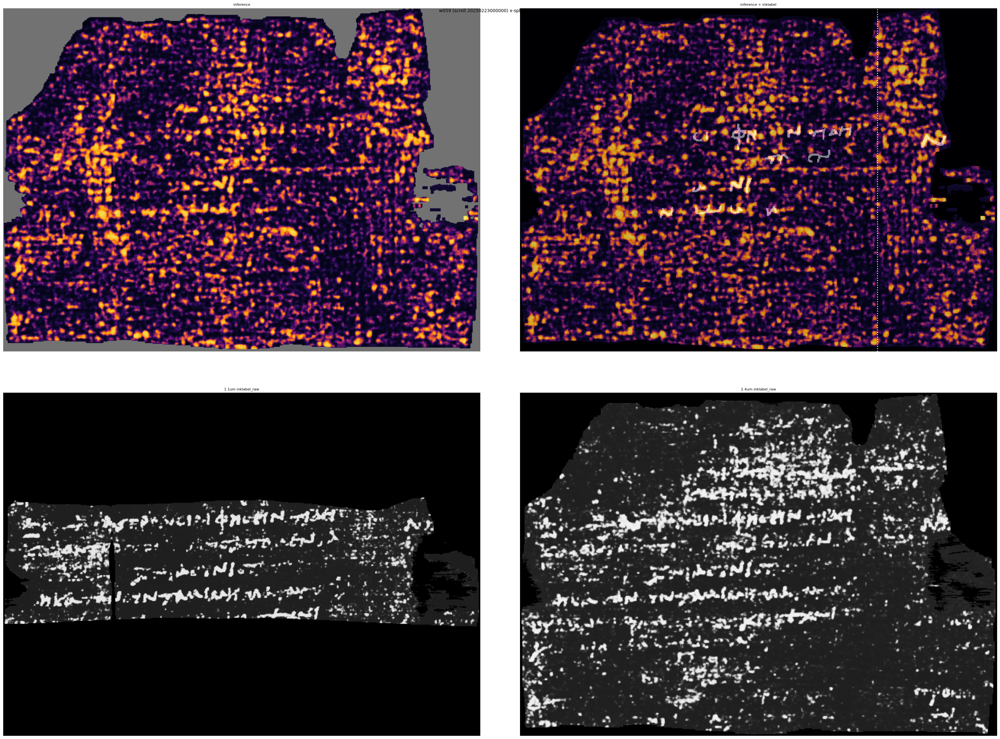

[saved] output/eval_visualizations/31_early_gated_patch_groupdro_23_13-58-13_surface_side/w059_20250223000000_default.png pred grid (451, 626)


In [6]:
# w059 — default surface (papyrus-to-air)
render_side("w059", "default", MODEL, C)

[predict] reading 234541 tiles in 444 row-strips (side_reversed_20250223000000)


[predict] side_reversed_20250223000000 done in 220.9s  predict 131.6s (59.6%)  read/wait  89.3s (40.4%)


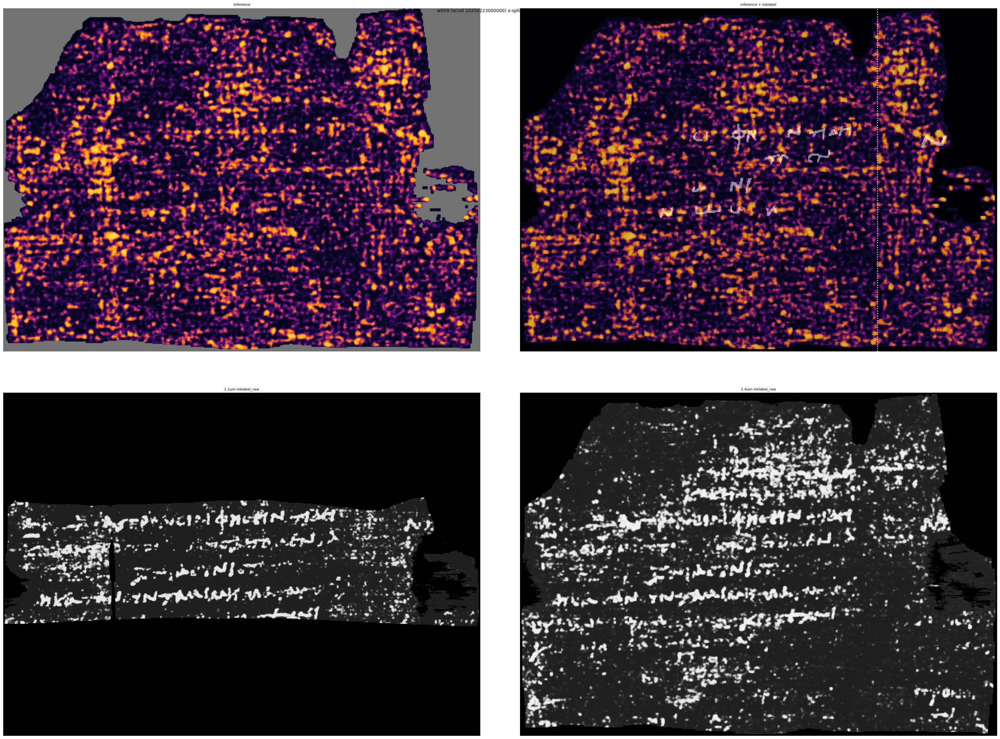

[saved] output/eval_visualizations/31_early_gated_patch_groupdro_23_13-58-13_surface_side/w059_20250223000000_reversed.png pred grid (451, 626)


In [7]:
# w059 — reversed surface (air-to-papyrus)
render_side("w059", "reversed", MODEL, C)

[predict] reading 10797 tiles in 158 row-strips (side_default_20231201215900)


[predict] side_default_20231201215900 done in  10.2s  predict   6.2s (60.8%)  read/wait   4.0s (39.2%)


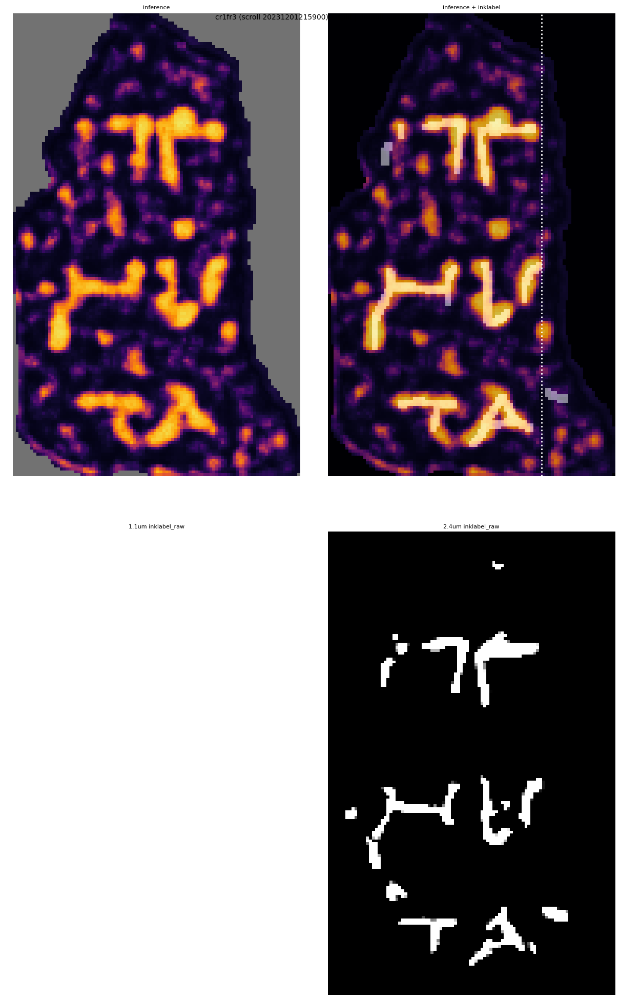

[saved] output/eval_visualizations/31_early_gated_patch_groupdro_23_13-58-13_surface_side/cr1fr3_20231201215900_default.png pred grid (158, 98)


In [8]:
# Cr1 Fr3 — default surface (papyrus-to-air)
render_side("cr1fr3", "default", MODEL, C)

[predict] reading 10797 tiles in 158 row-strips (side_reversed_20231201215900)


[predict] side_reversed_20231201215900 done in  10.2s  predict   6.2s (60.3%)  read/wait   4.1s (39.7%)


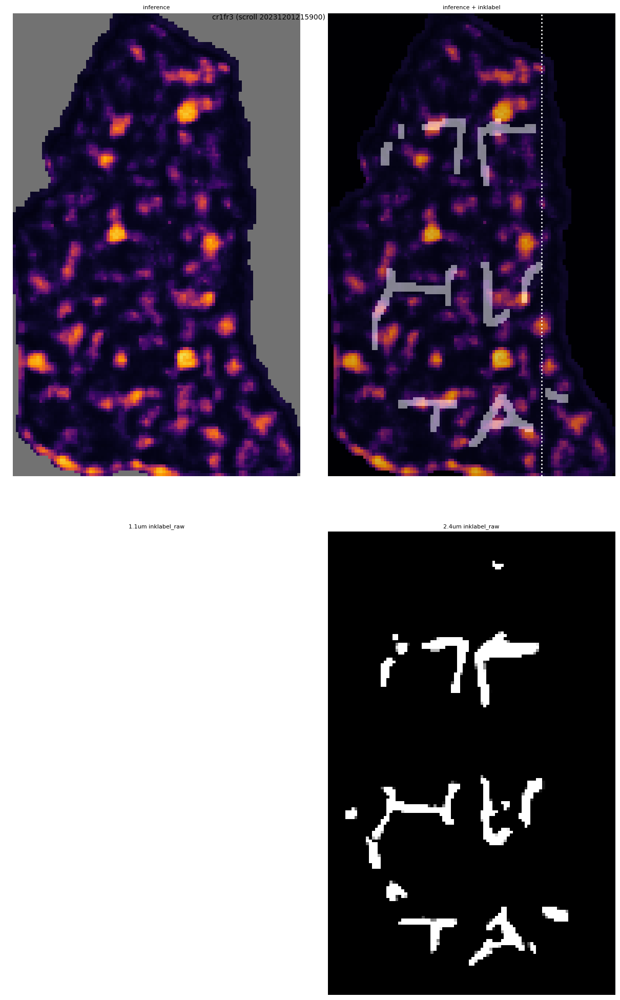

[saved] output/eval_visualizations/31_early_gated_patch_groupdro_23_13-58-13_surface_side/cr1fr3_20231201215900_reversed.png pred grid (158, 98)


In [9]:
# Cr1 Fr3 — reversed surface (air-to-papyrus)
render_side("cr1fr3", "reversed", MODEL, C)

[predict] reading 49876 tiles in 333 row-strips (side_default_20250628074500)


[predict] side_default_20250628074500 done in  47.4s  predict  28.4s (59.8%)  read/wait  19.0s (40.2%)


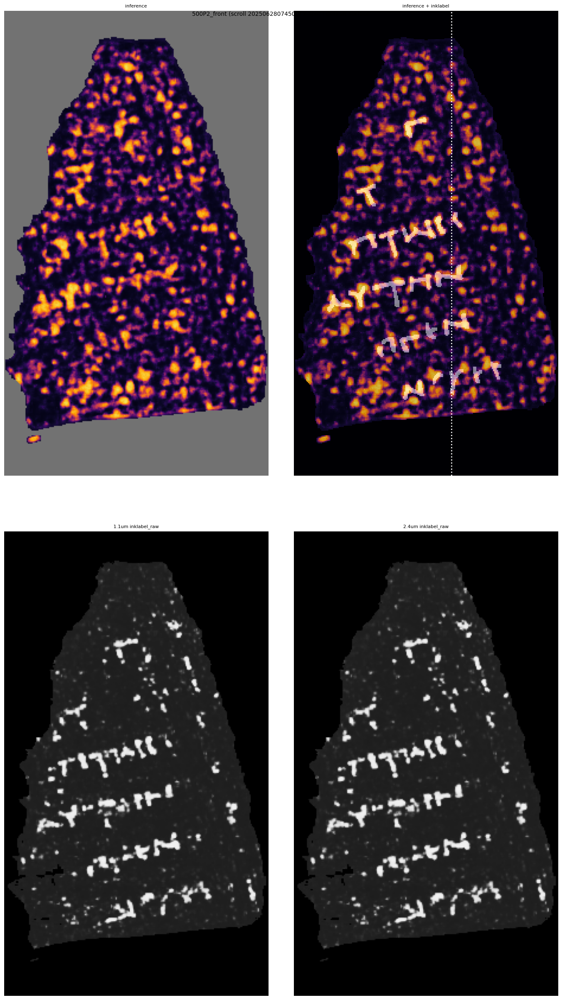

[saved] output/eval_visualizations/31_early_gated_patch_groupdro_23_13-58-13_surface_side/500P2_front_20250628074500_default.png pred grid (392, 223)


In [10]:
# 500P2 front — default surface (papyrus-to-air)
render_side("500P2_front", "default", MODEL, C)

[predict] reading 49876 tiles in 333 row-strips (side_reversed_20250628074500)


[predict] side_reversed_20250628074500 done in  47.6s  predict  28.3s (59.5%)  read/wait  19.3s (40.5%)


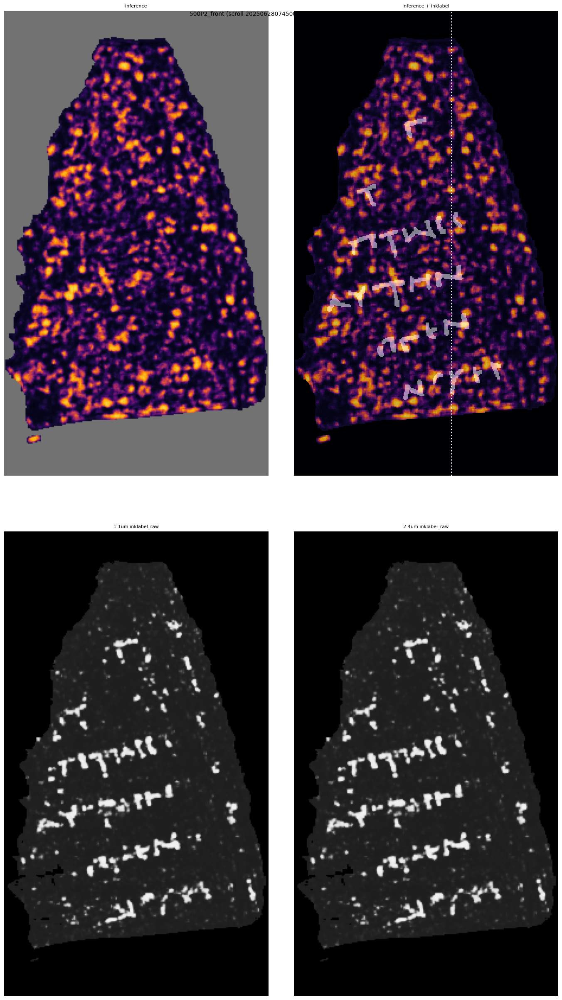

[saved] output/eval_visualizations/31_early_gated_patch_groupdro_23_13-58-13_surface_side/500P2_front_20250628074500_reversed.png pred grid (392, 223)


In [11]:
# 500P2 front — reversed surface (air-to-papyrus)
render_side("500P2_front", "reversed", MODEL, C)